# Cell deconvolution comparison and quality control
**Performed by Louise Huuki**

In [1]:
library(tidyverse)
library(ggpubr)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.2     ✔ dplyr   1.0.7
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



## Functions

In [2]:
get_pheno <- function(){
    df = data.table::fread("/ceph/projects/v4_phase3_paper/inputs/phenotypes/_m/merged_phenotypes.csv") %>%
        filter(Dx %in% c("SZ", "CTL"), Age > 17)
    return(df)
}

memPHENO <- memoise::memoise(get_pheno)

save_img <- function(image, fn, w, h){
    for(ext in c(".svg", ".pdf", ".png")){
        ggsave(file=paste0(fn, ext), plot=image, width=w, height=h)
    }
}

## Prepare data

In [3]:
load("../_h/est_prop_Bisque.Rdata")

In [4]:
df = est_prop_bisque$caudate$Est.prop.long %>% 
    inner_join(memPHENO(), by=c("sample"="RNum")) %>%
    mutate_if(is.character, as.factor) %>%
    rename("Proportion"="prop")
df[1:2, 1:10]

,sample,cell_type,Proportion,Sex,Race,Dx,Age,mitoRate,rRNA_rate,totalAssignedGene
,<fct>,<fct>,<dbl>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>
1,R12864,Astro,0.07995174,Female,AA,SZ,42.98,0.03265387,8.675159e-05,0.5148545
2,R12865,Astro,0.03964055,Male,AA,SZ,53.12,0.01978740,6.976684e-05,0.5207789


## Cell type proportion plots

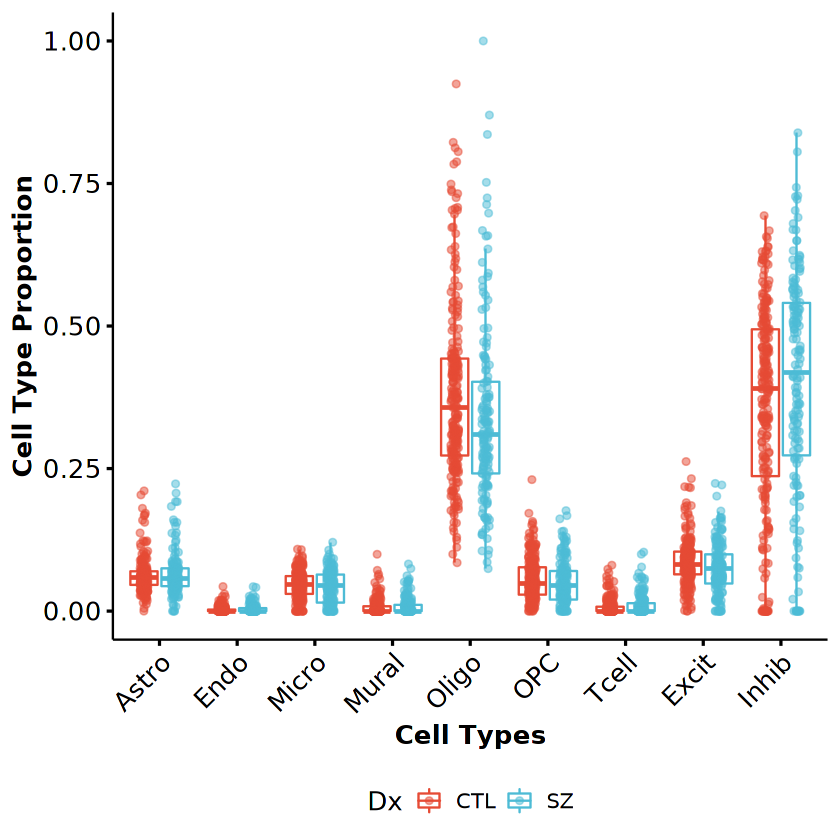

In [5]:
bxp = df %>% ggboxplot(x="cell_type", y="Proportion", color="Dx", #facet.by="Cell_Type",
                       panel.labs.font=list(face='bold'), palette="npg", ylim=c(0, 1),
                       outlier.shape=NA, ylab='Cell Type Proportion', add='jitter', 
                       add.params=list(alpha=0.5),  xlab="Cell Types", legend="bottom", 
                       ggtheme=theme_pubr(base_size=15)) +
    font("xy.title", face="bold") + rotate_x_text(45)
print(bxp)
save_img(bxp, paste0("boxplot_celltypes_dx"), w=7, h=6)

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


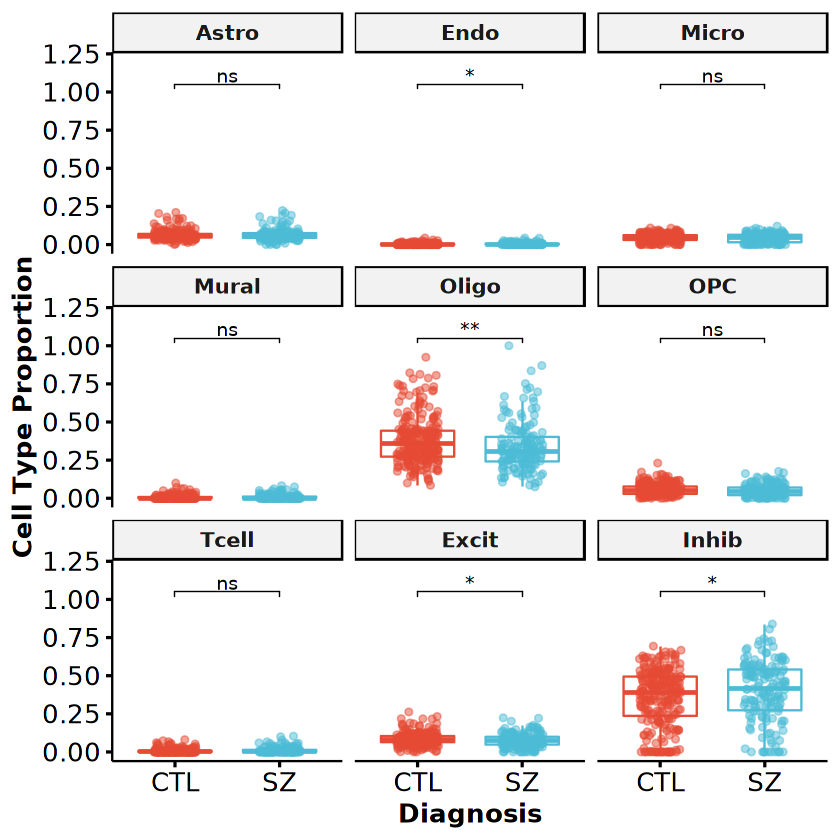

In [6]:
bxp = df %>% ggboxplot(x="Dx", y="Proportion", color="Dx", facet.by="cell_type",
                       panel.labs.font=list(face='bold'), palette="npg", ylim=c(0, 1.2),
                       outlier.shape=NA, ylab='Cell Type Proportion', add='jitter', 
                       add.params=list(alpha=0.5),  ncol=3, xlab="Diagnosis", 
                       legend="None", ggtheme=theme_pubr(base_size=15)) +
    stat_compare_means(comparisons=list(c("CTL", "SZ")), aes(label=..p.signif..), 
                       method="wilcox.test") +
    font("xy.title", face="bold")
print(bxp)
save_img(bxp, paste0("boxplot_dxBYcelltype"), w=7, h=6)

## Quality control

In [7]:
celltypes = unique(est_prop_bisque$caudate$Est.prop.long$cell_type)

### Normalized data

In [8]:
load("/ceph/projects/v4_phase3_paper/analysis/differential_expression/_m/genes/voomSVA.RData")
norm_df = v$E %>% t
pca_df1 = prcomp(norm_df, center=TRUE)$x

norm_dt = pca_df1 %>% as.data.frame %>% rownames_to_column("sample") %>% 
    select(c(sample, PC1, PC2, PC3, PC4, PC5)) %>% 
    pivot_longer(-sample, names_to="PC", values_to="PC_values") %>%
    mutate_if(is.character, as.factor)
norm_dt %>% head(2)

Loading required package: limma



sample,PC,PC_values
<fct>,<fct>,<dbl>
R12864,PC1,-35.34084
R12864,PC2,30.02432


### Residualized data

In [9]:
res_df = data.table::fread(paste0("/ceph/projects/v4_phase3_paper/analysis/",
                                  "differential_expression/_m/genes/residualized_expression.tsv")) %>%
    column_to_rownames("V1") %>% t
pca_df2 = prcomp(res_df, center=TRUE)$x

res_dt = pca_df2 %>% as.data.frame %>% rownames_to_column("sample") %>% 
    select(c(sample, PC1, PC2, PC3, PC4, PC5)) %>% 
    pivot_longer(-sample, names_to="PC", values_to="PC_values") %>%
    mutate_if(is.character, as.factor)
res_dt %>% head(2)

Warning message in data.table::fread(paste0("/ceph/projects/v4_phase3_paper/analysis/", :
“Detected 393 column names but the data has 394 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”


sample,PC,PC_values
<fct>,<fct>,<dbl>
R12864,PC1,-0.2076714
R12864,PC2,57.5667551


### Plot scatter for cell types

In [10]:
dir.create("quality_control")

[1] "Astro"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



[1] "Endo"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



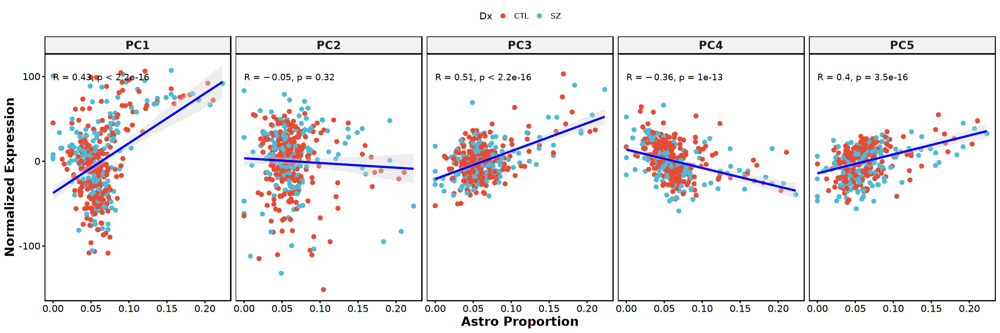

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



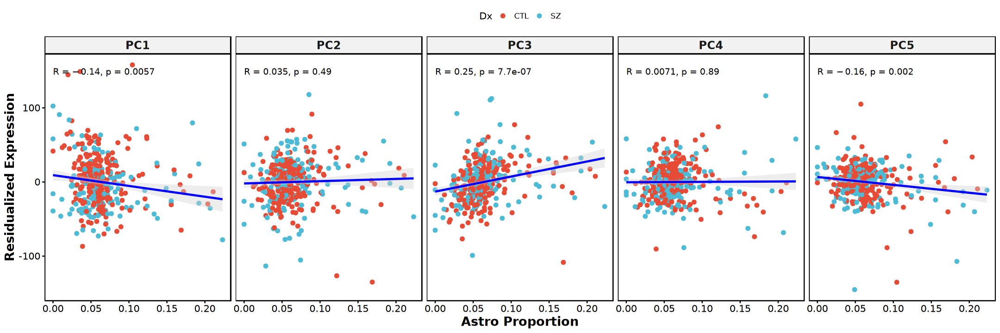

`geom_smooth()` using formula 'y ~ x'



[1] "Micro"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



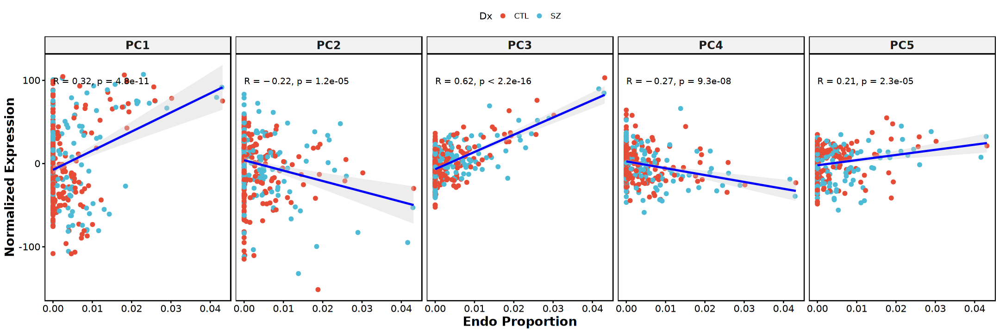

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



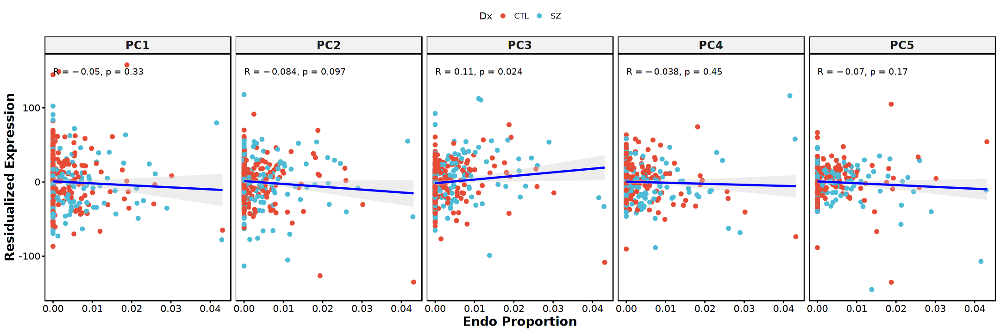

`geom_smooth()` using formula 'y ~ x'



[1] "Mural"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



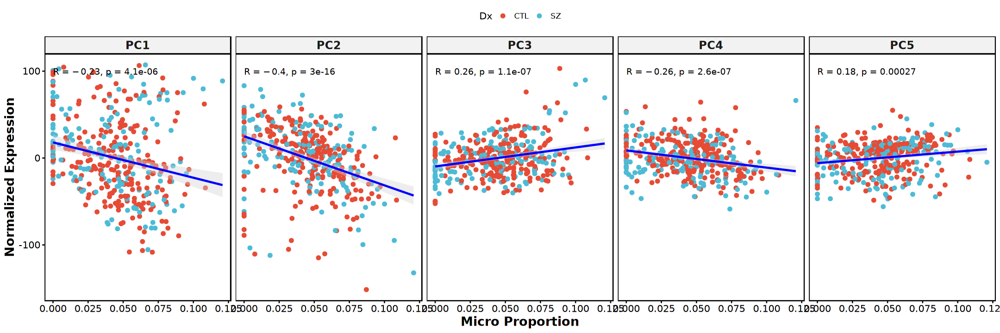

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



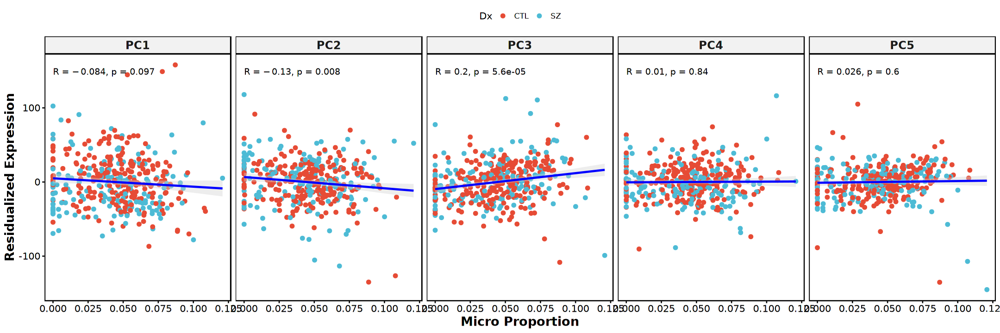

`geom_smooth()` using formula 'y ~ x'



[1] "Oligo"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



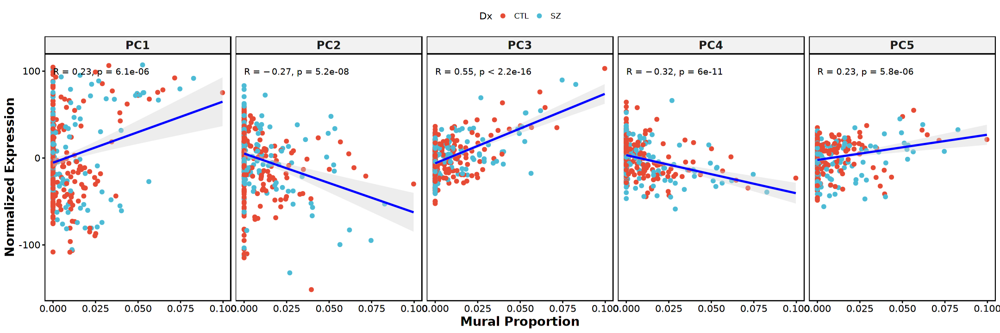

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



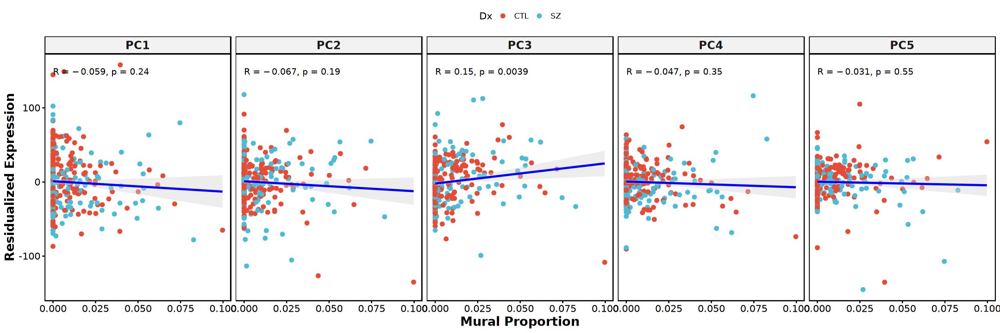

`geom_smooth()` using formula 'y ~ x'



[1] "OPC"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



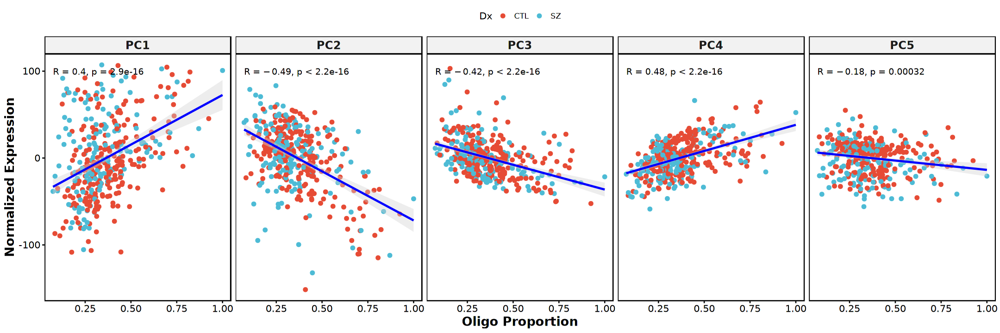

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



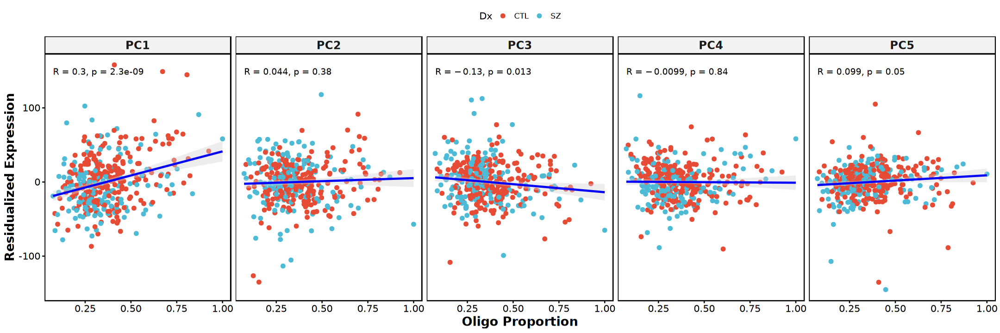

`geom_smooth()` using formula 'y ~ x'



[1] "Tcell"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



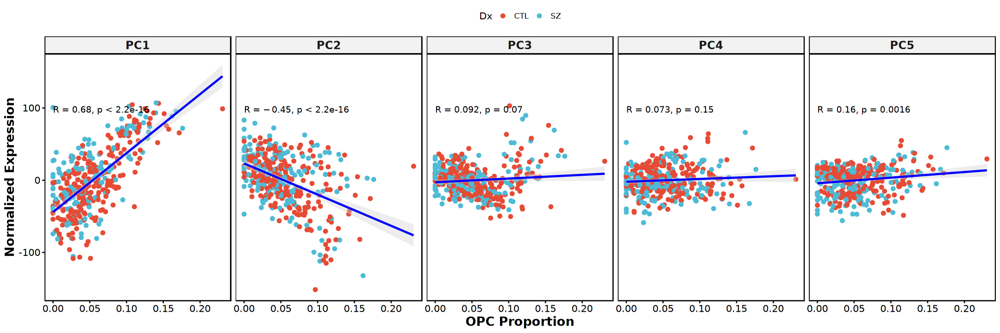

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



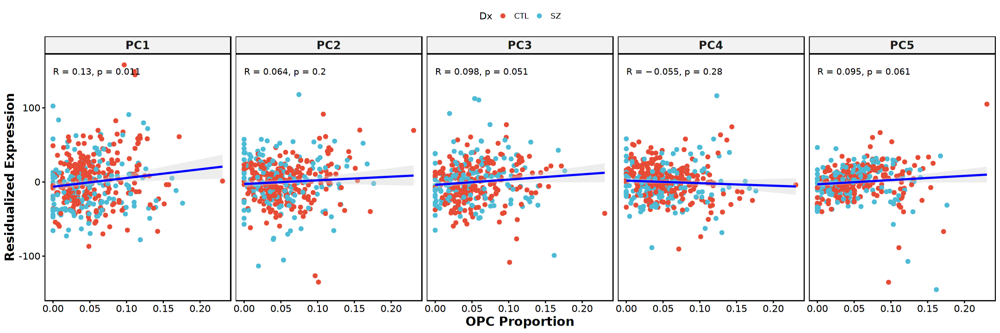

`geom_smooth()` using formula 'y ~ x'



[1] "Excit"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



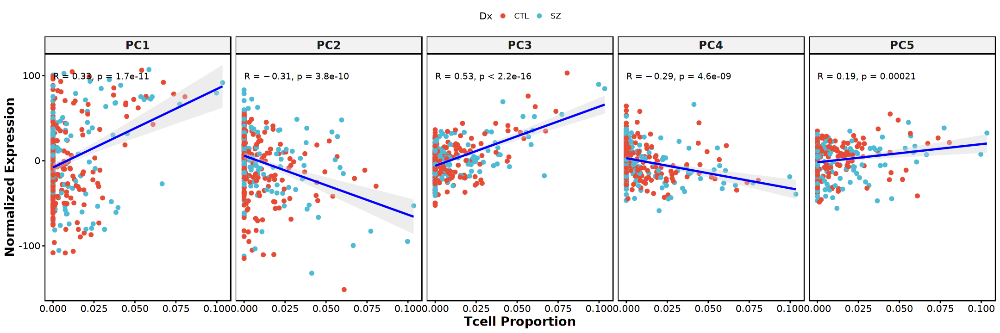

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



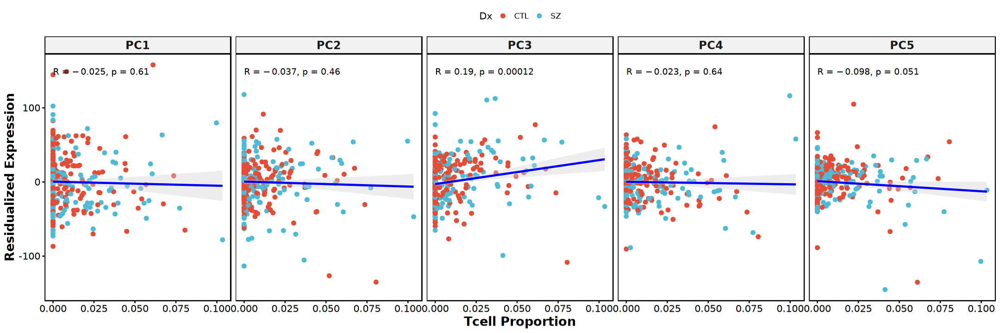

`geom_smooth()` using formula 'y ~ x'



[1] "Inhib"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



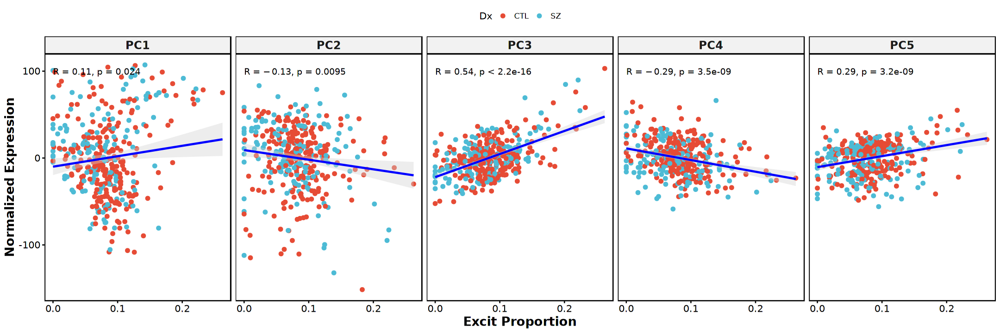

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



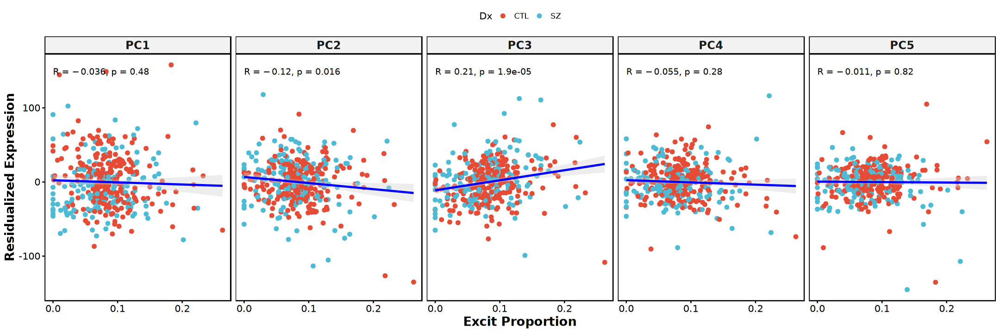

`geom_smooth()` using formula 'y ~ x'



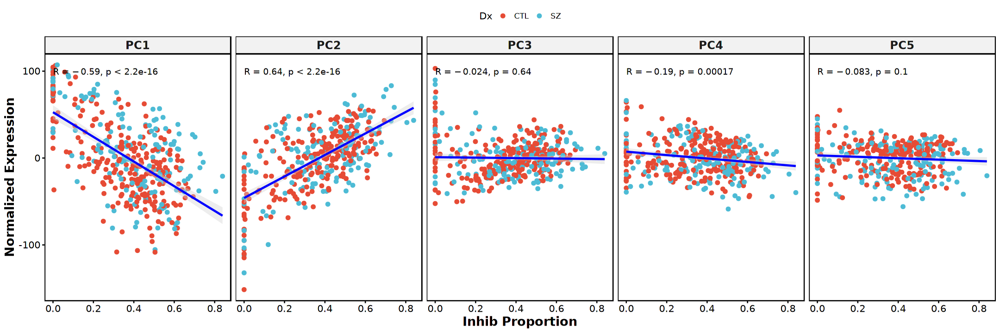

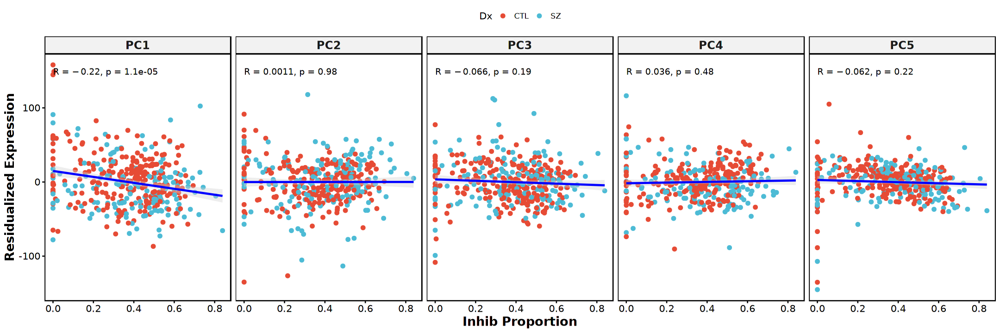

In [11]:
options(repr.plot.width=18, repr.plot.height=6)
for(ct in celltypes){
    flush.console()
    print(ct)
    ## Normalized
    sca = norm_dt %>% inner_join(df, by="sample") %>% filter(cell_type == ct) %>%
        ggscatter(y="PC_values", x="Proportion", color="Dx", facet.by=c('PC'), ncol=5, 
                  add='reg.line', conf.int=TRUE, cor.coef=TRUE, palette="npg",
                  xlab=paste(ct, "Proportion"), ylab="Normalized Expression",
                  panel.labs.font=list(face='bold', size = 14),
                  add.params=list(color="blue", fill="lightgray")) +
        font("xy.text", size=12) + font("xy.title", size=16, face="bold")
    save_img(sca, paste0("quality_control/scatter_log2cpm_dx_5pcs_",ct), w=18, h=6)
    print(sca)
    ## Residualized
    sca = res_dt %>% inner_join(df, by="sample") %>% filter(cell_type == ct) %>%
        ggscatter(y="PC_values", x="Proportion", color="Dx", facet.by=c('PC'), ncol=5, 
                  add='reg.line', conf.int=TRUE, cor.coef=TRUE, palette="npg",
                  xlab=paste(ct, "Proportion"), ylab="Residualized Expression",
                  panel.labs.font=list(face='bold', size = 14),
                  add.params=list(color="blue", fill="lightgray")) +
        font("xy.text", size=12) + font("xy.title", size=16, face="bold")
    save_img(sca, paste0("quality_control/scatter_resdf_dx_5pcs_",ct), w=18, h=6)
    print(sca)
}

[1] "Astro"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



[1] "Endo"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



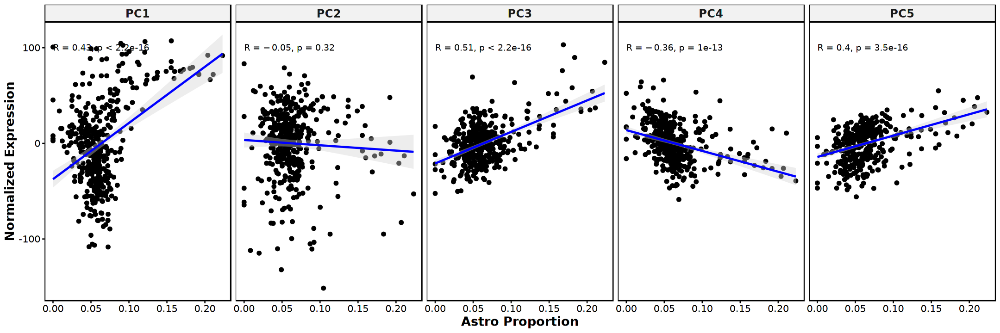

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



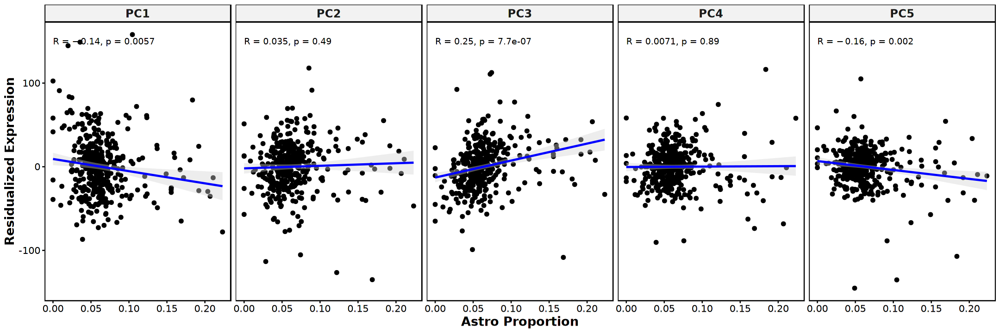

`geom_smooth()` using formula 'y ~ x'



[1] "Micro"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



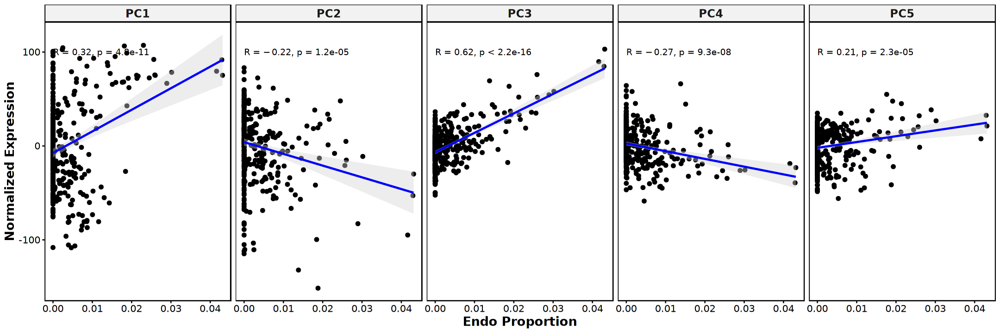

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



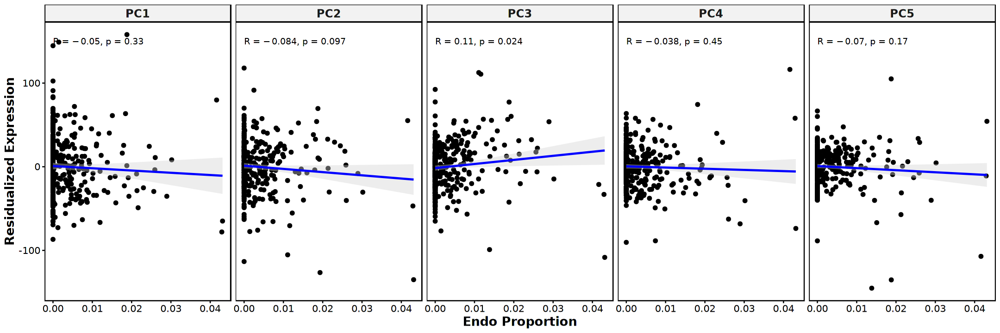

`geom_smooth()` using formula 'y ~ x'



[1] "Mural"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



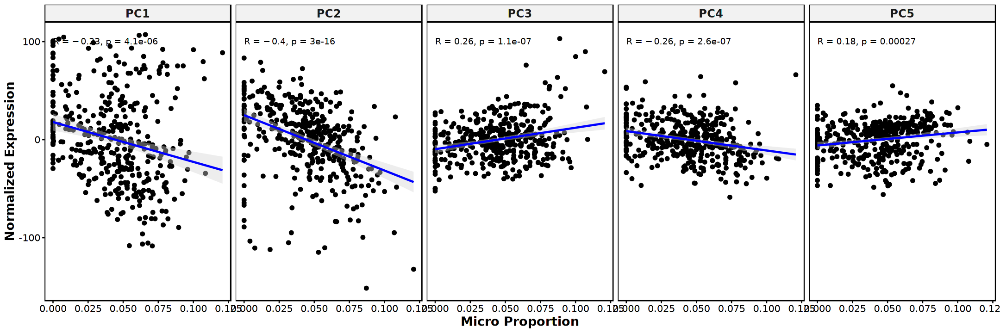

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



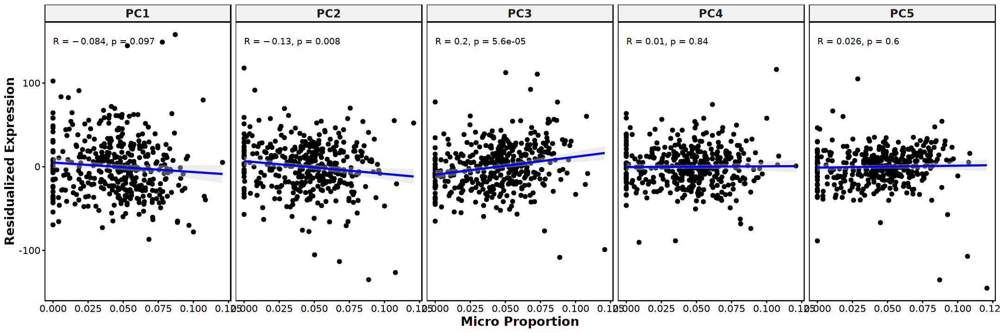

`geom_smooth()` using formula 'y ~ x'



[1] "Oligo"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



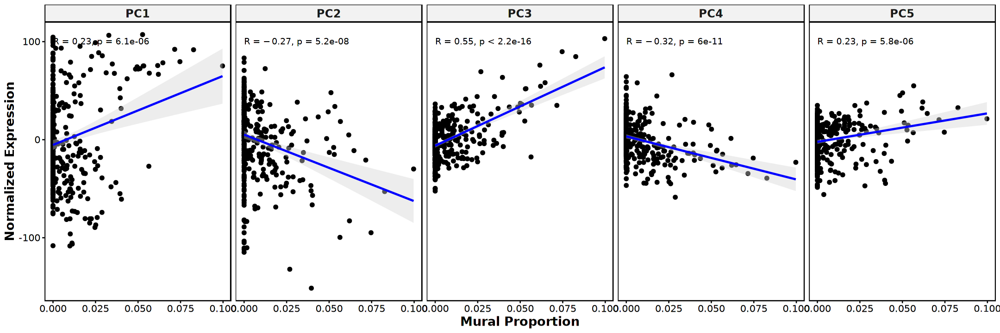

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



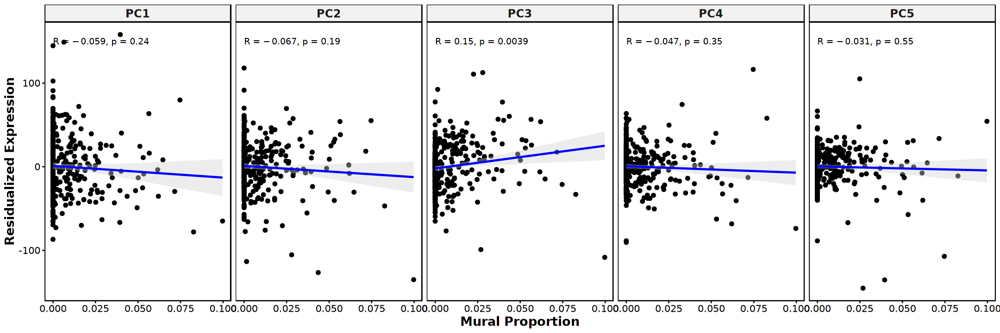

`geom_smooth()` using formula 'y ~ x'



[1] "OPC"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



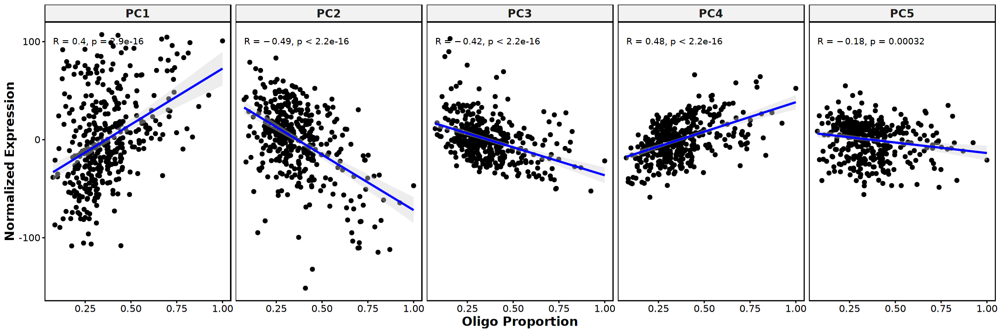

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



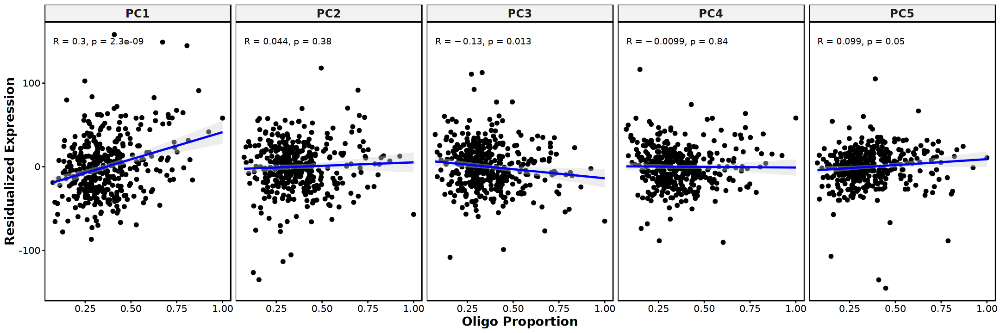

`geom_smooth()` using formula 'y ~ x'



[1] "Tcell"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



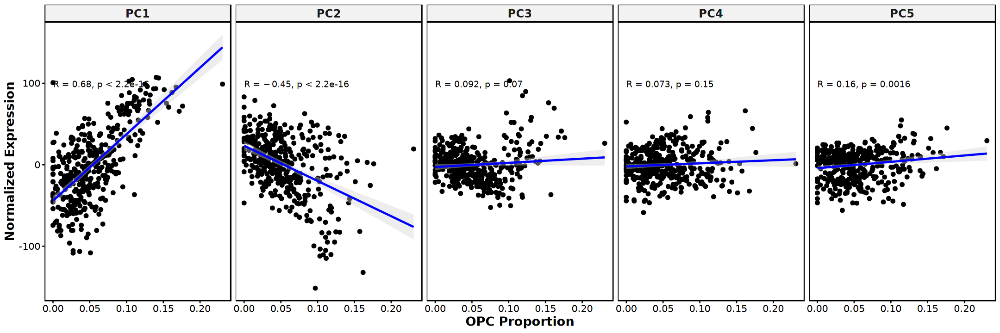

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



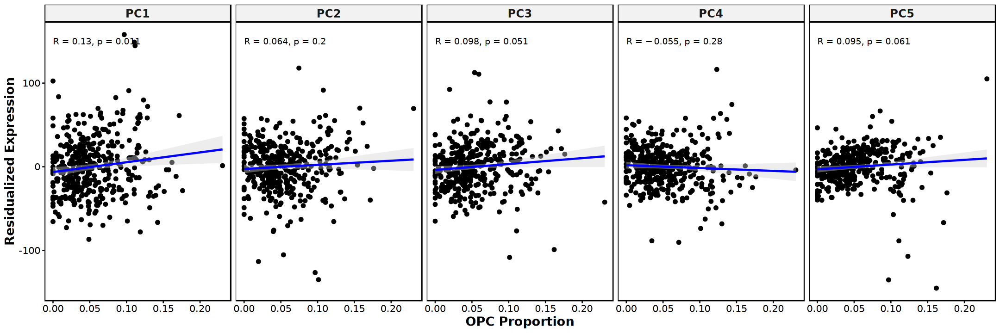

`geom_smooth()` using formula 'y ~ x'



[1] "Excit"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



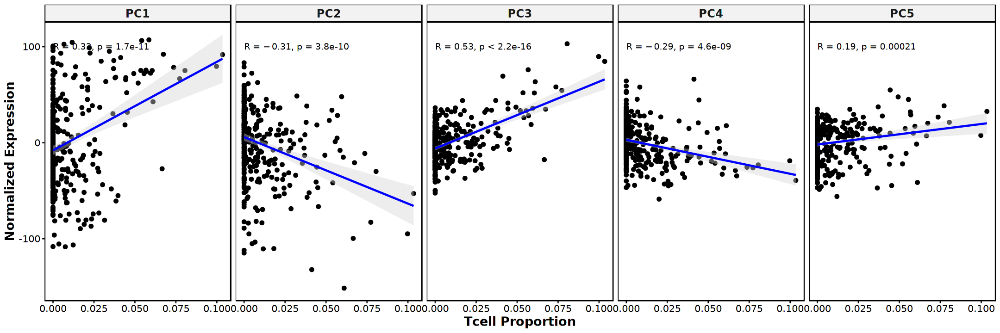

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



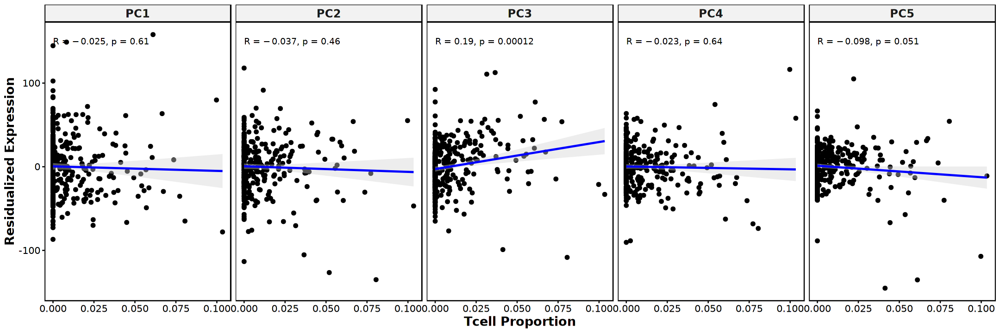

`geom_smooth()` using formula 'y ~ x'



[1] "Inhib"


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



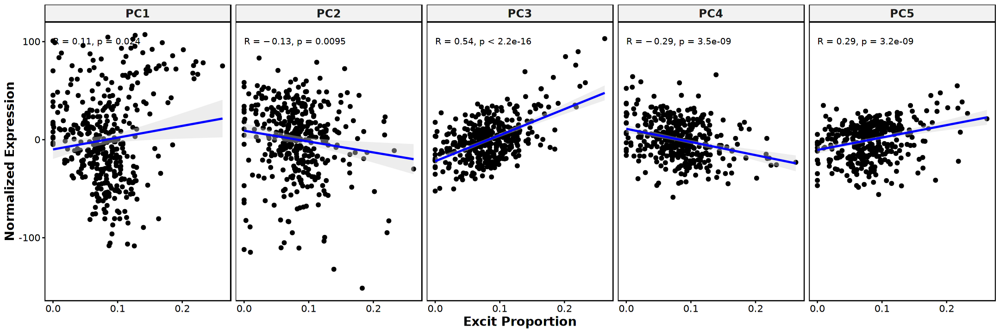

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



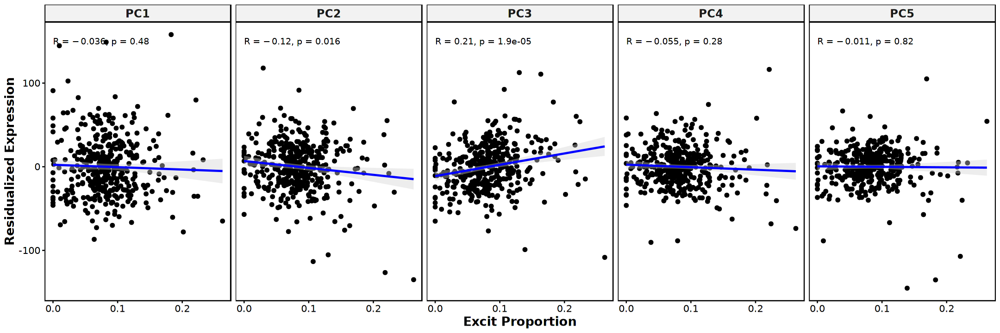

`geom_smooth()` using formula 'y ~ x'



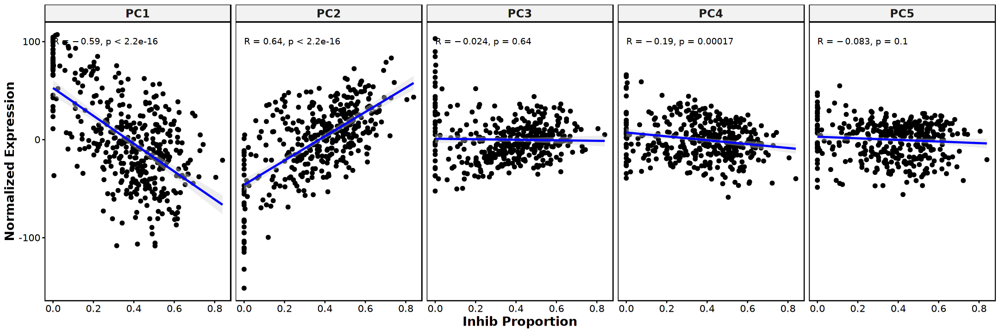

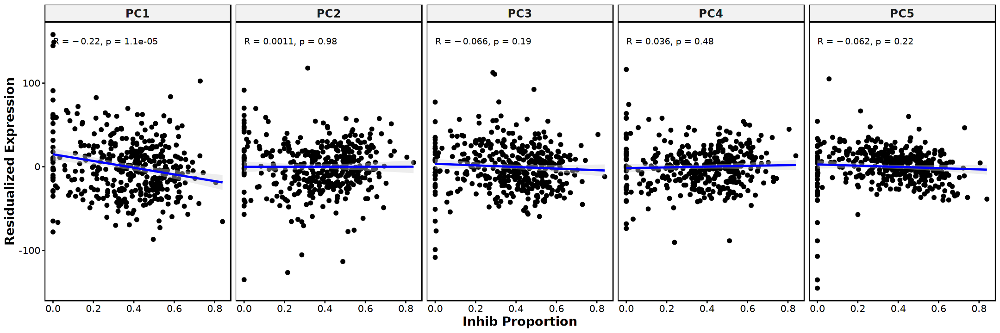

In [12]:
options(repr.plot.width=18, repr.plot.height=6)
for(ct in celltypes){
    flush.console()
    print(ct)
    ## Normalized
    sca = norm_dt %>% inner_join(df, by="sample") %>% filter(cell_type == ct) %>%
        ggscatter(y="PC_values", x="Proportion", facet.by=c('PC'), ncol=5, 
                  add='reg.line', conf.int=TRUE, cor.coef=TRUE, palette="npg",
                  xlab=paste(ct, "Proportion"), ylab="Normalized Expression",
                  panel.labs.font=list(face='bold', size = 14),
                  add.params=list(color="blue", fill="lightgray")) +
        font("xy.text", size=12) + font("xy.title", size=16, face="bold")
    save_img(sca, paste0("quality_control/scatter_log2cpm_5pcs_",ct), w=18, h=6)
    print(sca)
    ## Residualized
    sca = res_dt %>% inner_join(df, by="sample") %>% filter(cell_type == ct) %>%
        ggscatter(y="PC_values", x="Proportion", facet.by=c('PC'), ncol=5, 
                  add='reg.line', conf.int=TRUE, cor.coef=TRUE, palette="npg",
                  xlab=paste(ct, "Proportion"), ylab="Residualized Expression",
                  panel.labs.font=list(face='bold', size = 14),
                  add.params=list(color="blue", fill="lightgray")) +
        font("xy.text", size=12) + font("xy.title", size=16, face="bold")
    save_img(sca, paste0("quality_control/scatter_resdf_5pcs_",ct), w=18, h=6)
    print(sca)
}

## Reproducibility Information

In [13]:
Sys.time()
proc.time()
options(width = 120)
sessioninfo::session_info()

[1] "2021-07-29 16:45:10 EDT"

   user  system elapsed 
653.026 303.659 163.226 

─ Session info ───────────────────────────────────────────────────────────────────────────────────────────────────────
 setting  value                       
 version  R version 4.0.3 (2020-10-10)
 os       Arch Linux                  
 system   x86_64, linux-gnu           
 ui       X11                         
 language (EN)                        
 collate  en_US.UTF-8                 
 ctype    en_US.UTF-8                 
 tz       America/New_York            
 date     2021-07-29                  

─ Packages ───────────────────────────────────────────────────────────────────────────────────────────────────────────
 package     * version  date       lib source        
 abind         1.4-5    2016-07-21 [1] CRAN (R 4.0.2)
 assertthat    0.2.1    2019-03-21 [1] CRAN (R 4.0.2)
 backports     1.2.1    2020-12-09 [1] CRAN (R 4.0.2)
 base64enc     0.1-3    2015-07-28 [1] CRAN (R 4.0.2)
 broom         0.7.8    2021-06-24 [1] CRAN (R 4.0.3)
 cachem        1.0.5    2021-05-15 [1] CRAN (R 